<a href="https://colab.research.google.com/github/tnichlani/Deep_Learning/blob/main/CV_BOOK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import imutils

In [3]:
image = cv2.imread('/content/drive/MyDrive/Colab/dino.jpeg')

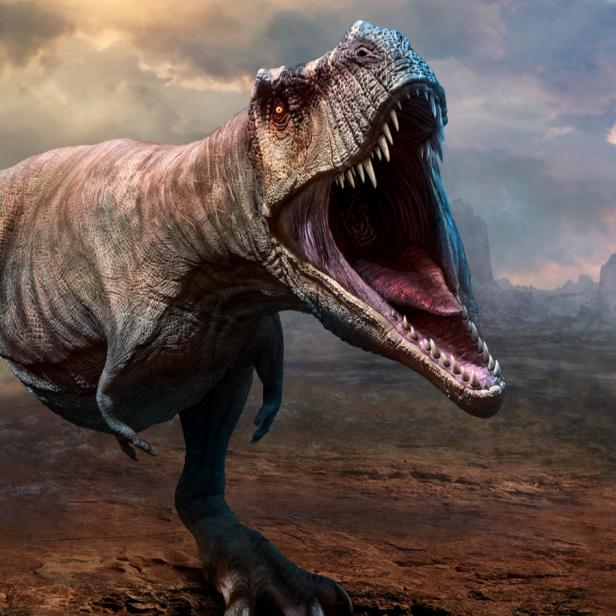

In [4]:
cv2_imshow(image)

In [5]:
(b,g,r) = image[0,0]
print("pixel at (0,0) - red: {}, green: {}, blue: {}".format(r,g,b))

pixel at (0,0) - red: 174, green: 145, blue: 113


In [6]:
image[0,0] = (0,0,255)
(b, g, r) = image[0,0]
print("pixel at (0,0) - red: {}, green: {}, blue: {}".format(r, g, b))

pixel at (0,0) - red: 255, green: 0, blue: 0


In [7]:
print("height:", image.shape[0])
print("width:", image.shape[1])
print("channels:", image.shape[2])

height: 616
width: 616
channels: 3


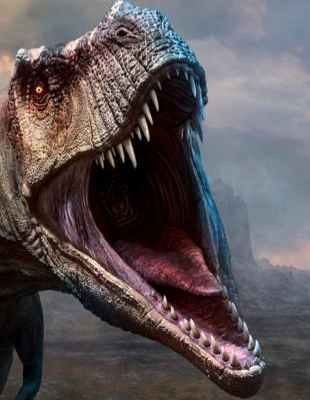

In [8]:
face = image[20:420, 240:550]
cv2_imshow(face)

In [9]:
face.shape

(400, 310, 3)

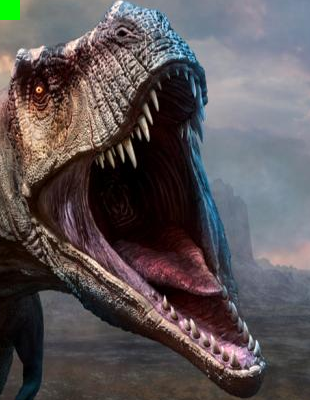

In [10]:
face[0:20, 0:20] = (0,255,0)
cv2_imshow(face)

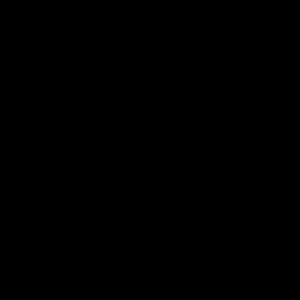

In [11]:
canvas = np.zeros((300, 300, 3), dtype='uint8')
cv2_imshow(canvas)

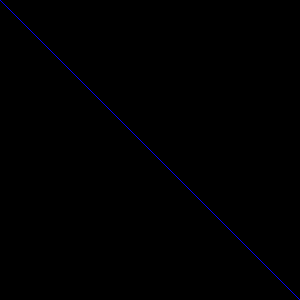

In [12]:
blue = (255, 0, 0)
cv2.line(canvas, (0,0), (300, 300), blue)
cv2_imshow(canvas)

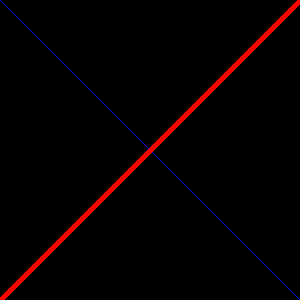

In [13]:
red = (0, 0, 255)
cv2.line(canvas, (300, 0), (0, 300), red, 3)
cv2_imshow(canvas)

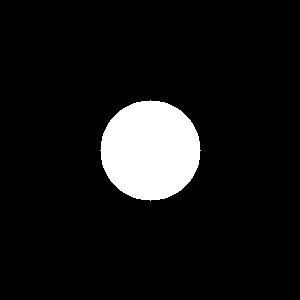

In [14]:
# draw white circle 
canvas = np.zeros((300, 300, 3), 'uint8')
white = (255, 255, 255)
cv2.circle(canvas, (150, 150), 50, white, -1)
cv2_imshow(canvas)

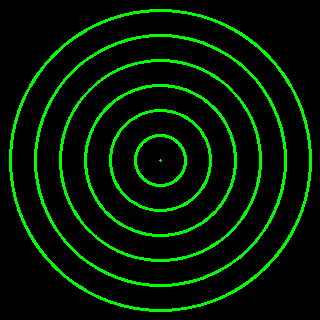

In [15]:
# draw concentric circles 

# define canvas
canvas = np.zeros((320, 320, 3), 'uint8')
# define circle color 
green = (0, 255, 0)
# define center co-ordinates 
Xcenter, Ycenter = canvas.shape[0] // 2, canvas.shape[1] // 2
# concentric
for r in range(0, 175, 25):
  cv2.circle(canvas, (Xcenter, Ycenter), r, green, 2)

# draw circle 
cv2_imshow(canvas)

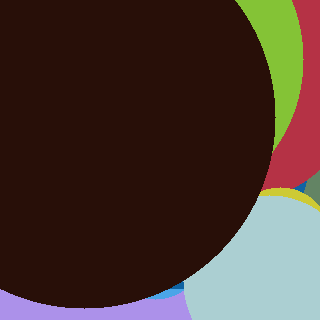

In [16]:
for i in range(0, 30):
    radius = np.random.randint(5, high = 200)
    color = np.random.randint(0, high = 256, size = (3,)).tolist()
    pt = np.random.randint(0, high = 300, size = (2,))
    cv2.circle(canvas, tuple(pt), radius, color, -1)
cv2_imshow(canvas)

In [17]:
def translate(image, x, y):
  M = np.float32([[1, 0, x], [0, 1, y]])
  shifted = cv2.warpAffine(image, M, (image.shape[0], image.shape[1]))
  return shifted

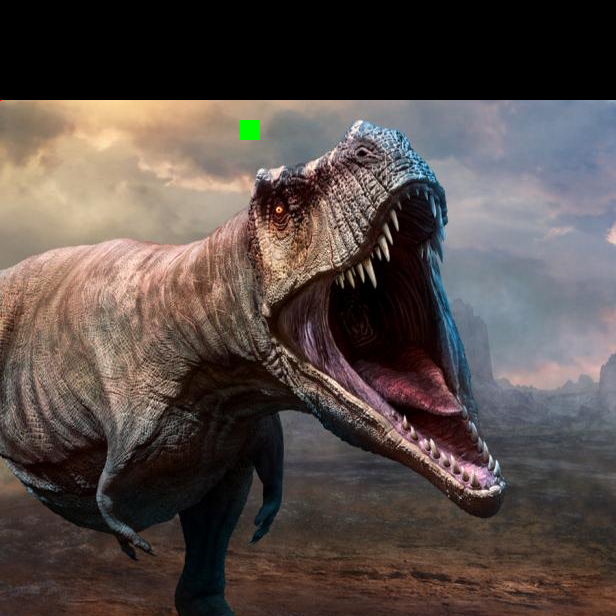

In [18]:
shifted = imutils.translate(image, 0, 100)
cv2_imshow(shifted)

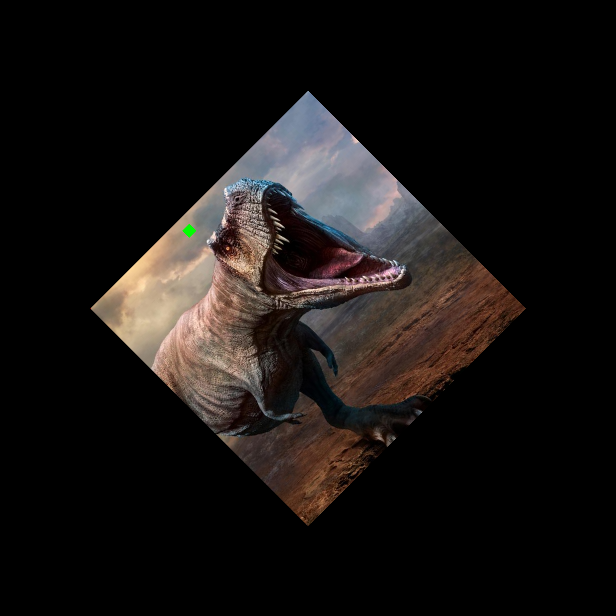

In [19]:
(h, w) = image.shape[0], image.shape[1]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, 45, 0.5)
rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow(rotated)

In [20]:
def rotate(image, angle, center = None, scale = 1.0):
  #get center
  (h, w) = image.shape[:2]
  if center is None:
    center = (w // 2, h // 2)
  
  M = cv2.getRotationMatrix2D(center, angle, scale)
  rotated = cv2.warpAffine(M, image, (w, h))
  return rotated

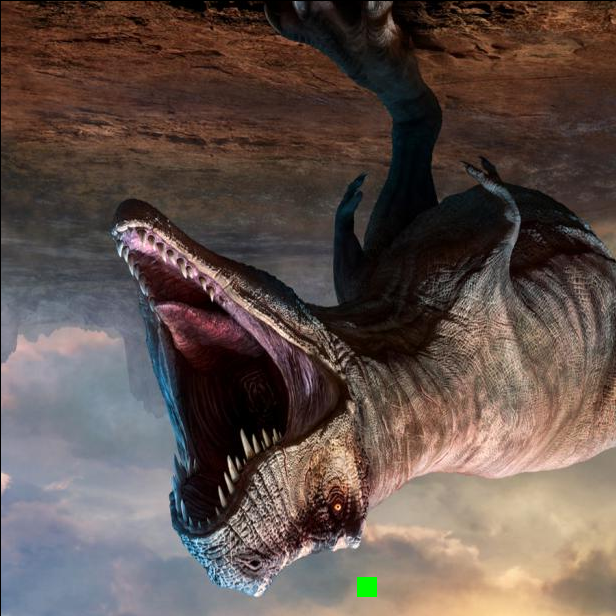

In [21]:
rotated = imutils.rotate(image, 180)
cv2_imshow(rotated)

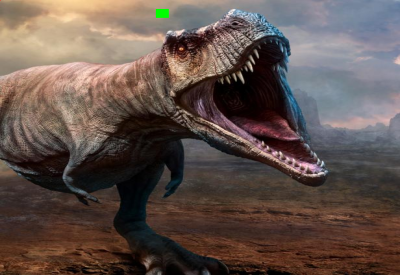

In [22]:
# get aspect ratio (div new ht. by old wd)
# aspect ratio 
r = 400.0 / image.shape[0]
#define new dimensions 
dim = (int(image.shape[1] * r), 275)
# reseize
resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
cv2_imshow(resized)

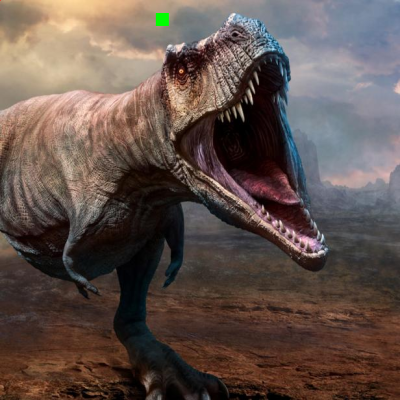

In [23]:
resized = imutils.resize(image, width=400)
cv2_imshow(resized)

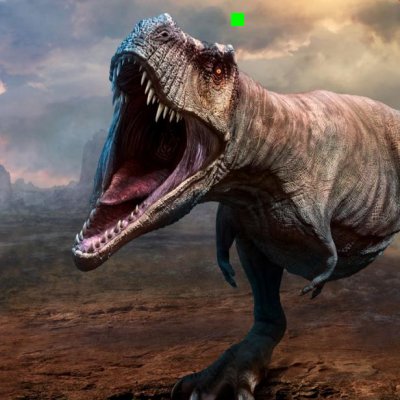

In [24]:
flipped = cv2.flip(resized, 1)
cv2_imshow(flipped)

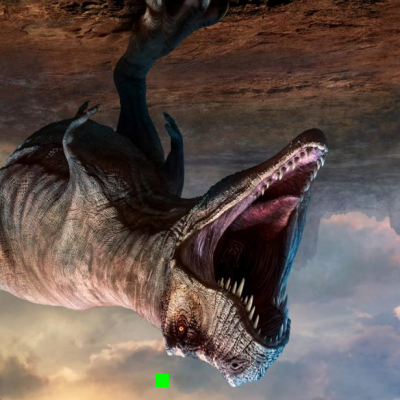

In [25]:
flipped = cv2.flip(resized, 0)
cv2_imshow(flipped)

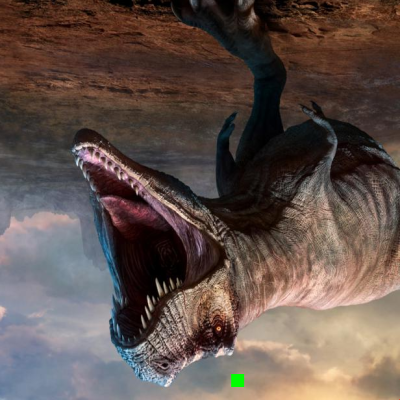

In [26]:
flipped = cv2.flip(resized, -1)
cv2_imshow(flipped)

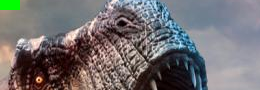

In [27]:
cropped = image[30:120, 240:500]
cv2_imshow(cropped)

In [28]:
print("max of 255 {}".format(cv2.add(np.uint8([200]), np.uint8([100]))))

max of 255 [[255]]


In [29]:
print("min of 0 {}".format(cv2.subtract(np.uint8([50]), np.uint8([100]))))

min of 0 [[0]]


In [30]:
print("wrap around {}".format(np.uint8([200]) + np.uint8([100])))

wrap around [44]


In [31]:
print("wrap around {}".format(np.uint8([50]) - np.uint8([100])))

wrap around [206]


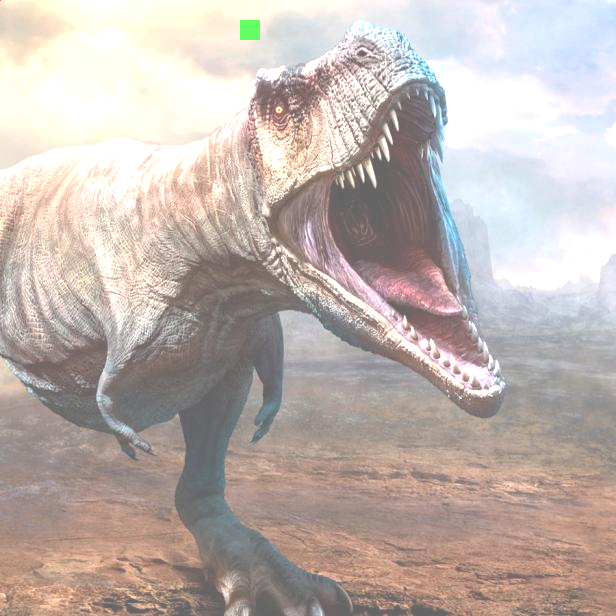

In [32]:
# addition 
M = np.ones(image.shape, 'uint8') * 100
added = cv2.add(image, M)
cv2_imshow(added)

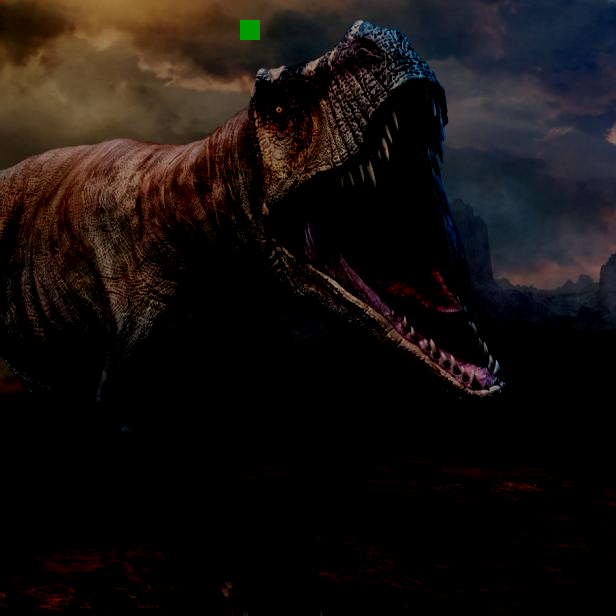

In [33]:
# subtraction 
M = np.ones(image.shape, "uint8") * 100
sub = cv2.subtract(image, M)
cv2_imshow(sub)

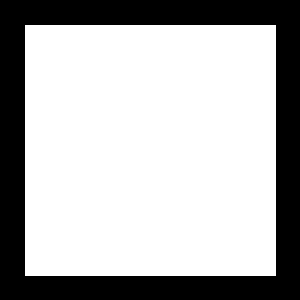

In [34]:
rectangle = np.zeros((300, 300), dtype="uint8")
cv2.rectangle(rectangle, (25, 25), (275, 275), 255, -1)
cv2_imshow(rectangle)

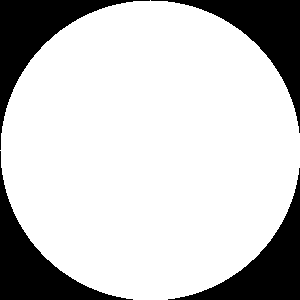

In [35]:
circle = np.zeros((300, 300), dtype="uint8")
cv2.circle(circle, (150, 150), 150, 255, -1)
cv2_imshow(circle)

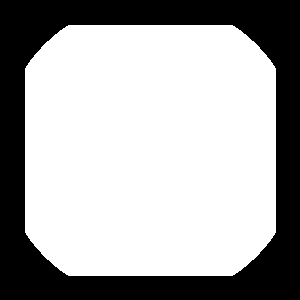

In [36]:
bitwiseAnd = cv2.bitwise_and(rectangle, circle)
cv2_imshow(bitwiseAnd)

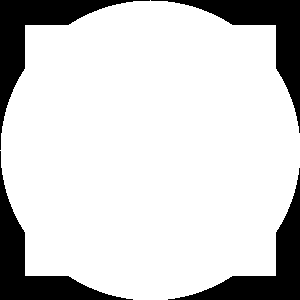

In [37]:
bitwiseOr = cv2.bitwise_or(rectangle, circle)
cv2_imshow(bitwiseOr)

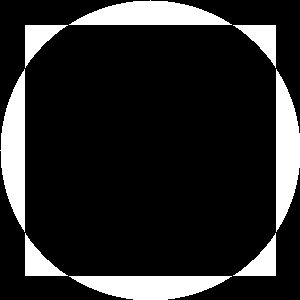

In [38]:
bitwiseXor = cv2.bitwise_xor(rectangle, circle)
cv2_imshow(bitwiseXor)

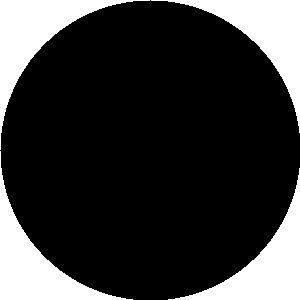

In [39]:
bitwiseNot = cv2.bitwise_not(circle)
cv2_imshow(bitwiseNot)

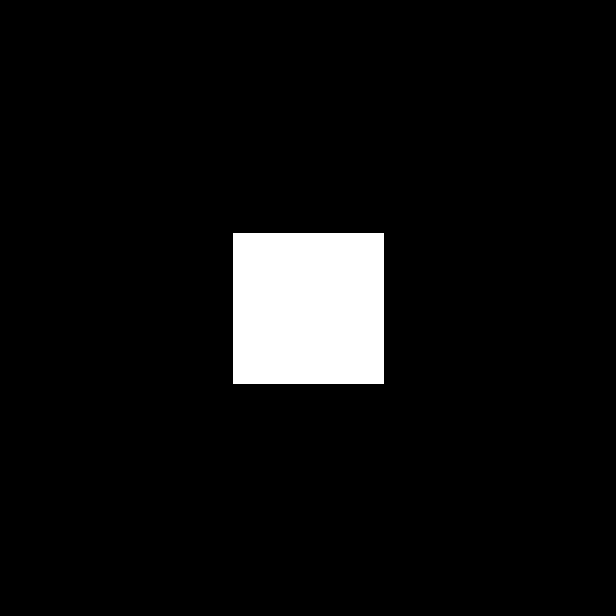

In [40]:
mask = np.zeros(image.shape[:2], "uint8")
(cX, cY) = (image.shape[1] // 2, image.shape[0] // 2)
rectangle = cv2.rectangle(mask, (cX - 75, cY - 75), (cX + 75, cY + 75), 255, -1)
cv2_imshow(mask)

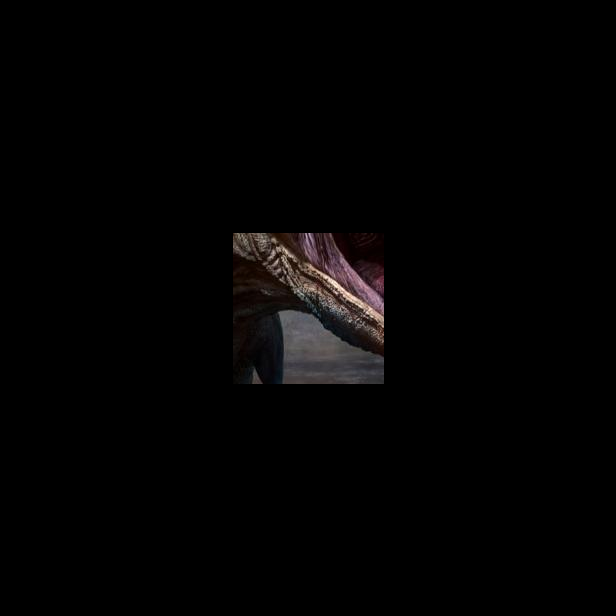

In [41]:
masked = cv2.bitwise_and(image, image, mask = mask)
cv2_imshow(masked)

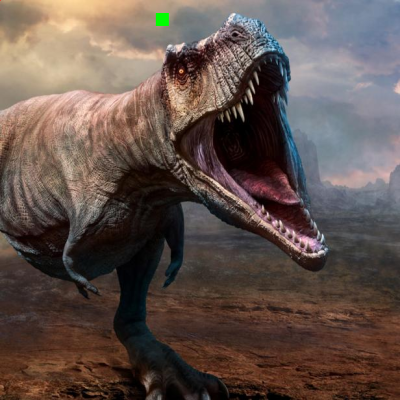

In [42]:
image = resized
cv2_imshow(image)

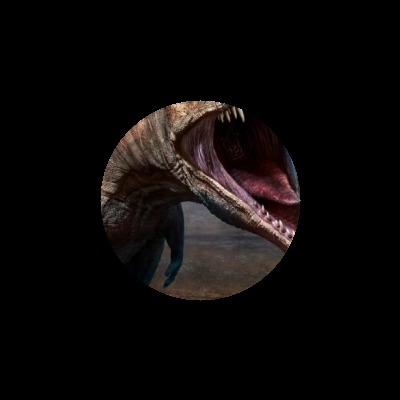

In [43]:
mask = np.zeros(image.shape[:2], "uint8")
(cX, cY) = (image.shape[1] // 2, image.shape[0] // 2)
circle = cv2.circle(mask, (cX, cY), 100, 255, -1)
masked = cv2.bitwise_and(image, image, mask = mask)
cv2_imshow(masked)

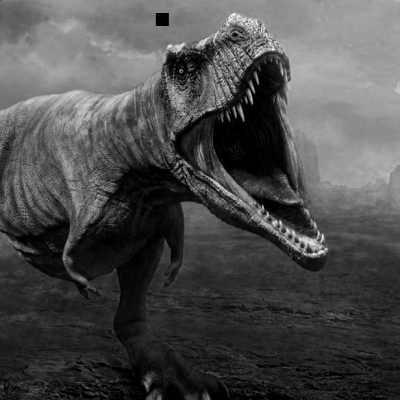

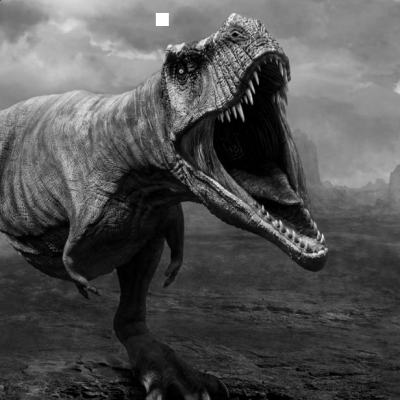

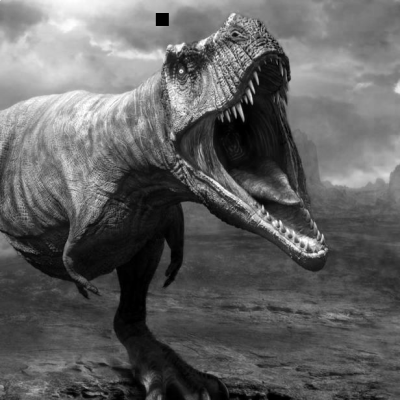

In [44]:
(B, G, R) = cv2.split(image)
for c in (B, G, R):
  cv2_imshow(c)

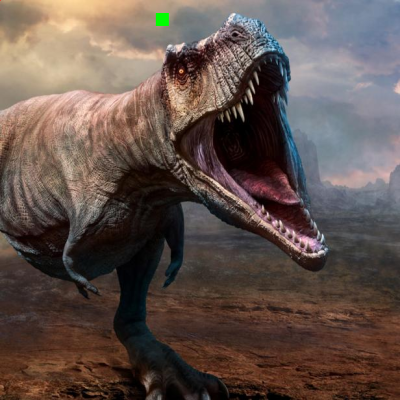

In [45]:
merged = cv2.merge([B, G, R])
cv2_imshow(merged)

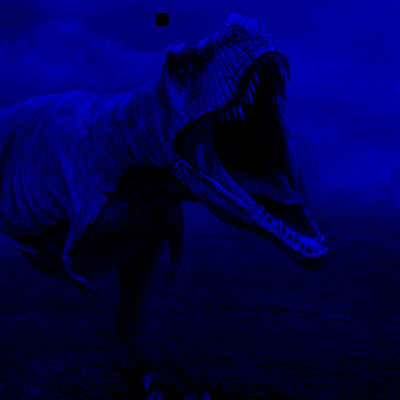

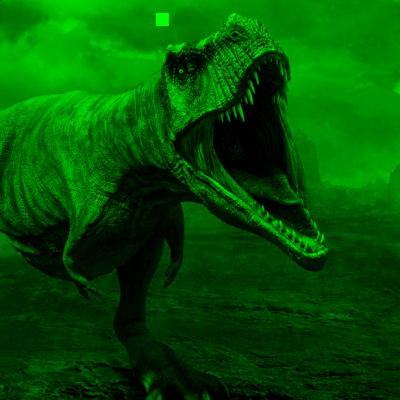

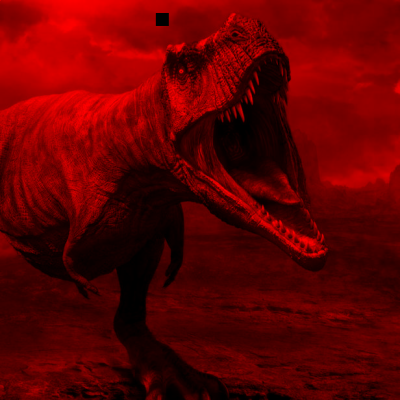

In [46]:
zeros = np.zeros(image.shape[:2], "uint8")
blue = cv2_imshow(cv2.merge([B, zeros, zeros]))
green = cv2_imshow(cv2.merge([zeros, G, zeros]))
red = cv2_imshow(cv2.merge([zeros, zeros, R]))

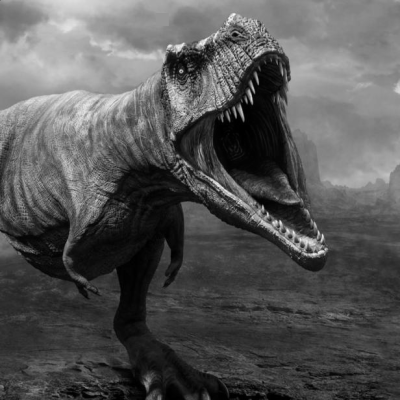

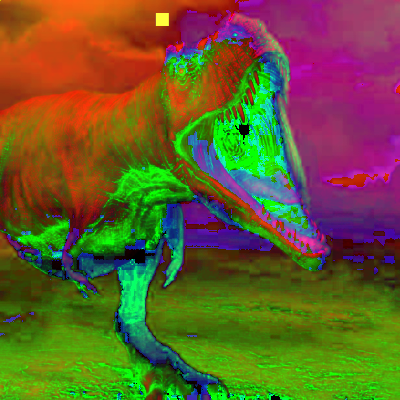

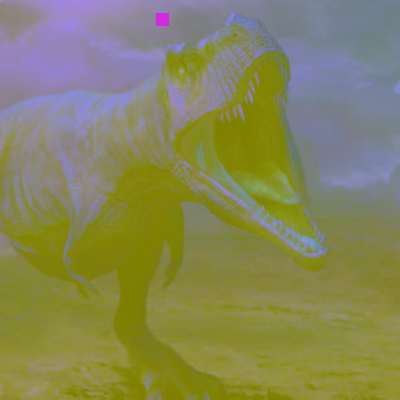

In [47]:
# color spaces 
lab = cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
hsv = cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2HSV))
gray = cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2LAB))

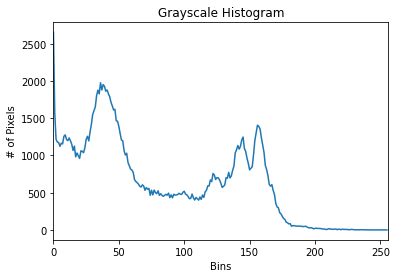

In [48]:
from matplotlib import pyplot as plt
hist = cv2.calcHist([image], [0], None, [256], [0, 256])
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

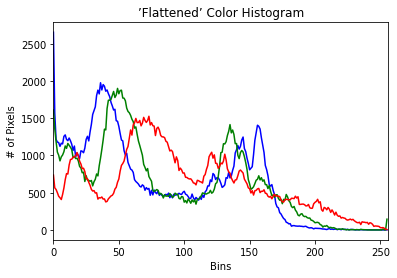

In [49]:
plt.figure()
plt.title("’Flattened’ Color Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")

chans = cv2.split(image)
colors = ("b", "g", "r")

for (chan, color) in zip(chans, colors):
  hist = cv2.calcHist([chan], [0], None, [256], [0, 256])
  plt.plot(hist, color = color)
  plt.xlim([0, 256])

2D histogram shape (32, 32), with 1024 values


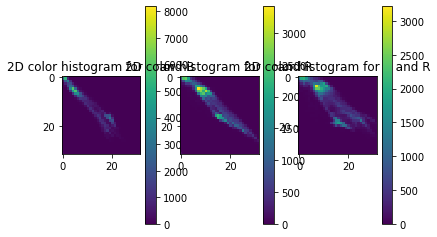

In [50]:
fig = plt.figure()

ax = fig.add_subplot(131)
hist = cv2.calcHist([chans[1], chans[0]], [0,1], None, [32,32], [0,256, 0, 256])
p = ax.imshow(hist, interpolation="nearest")
ax.set_title("2D color histogram for G and B")
plt.colorbar(p)

ax = fig.add_subplot(132)
hist = cv2.calcHist([chans[1], chans[2]], [0,1], None, [32,32], [0,256, 0, 256])
p = ax.imshow(hist, interpolation="nearest")
ax.set_title("2D color histogram for G and R")
plt.colorbar(p)

ax = fig.add_subplot(133)
hist = cv2.calcHist([chans[0], chans[2]], [0,1], None, [32,32], [0,256, 0, 256])
p = ax.imshow(hist, interpolation="nearest")
ax.set_title("2D color histogram for B and R")
plt.colorbar(p)

print("2D histogram shape {}, with {} values".format(hist.shape, hist.flatten().shape[0]))


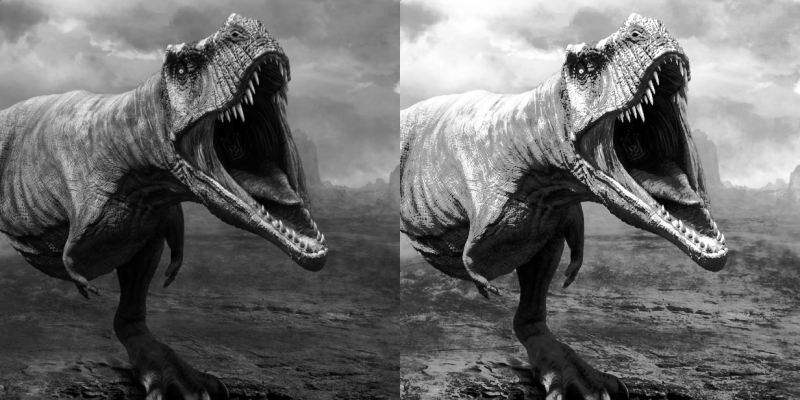

In [51]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

eq = cv2.equalizeHist(image)

cv2_imshow(np.hstack([image, eq]))

In [52]:
def plot_histogram(image, title, mask = None):
  chans = cv2.split(image)
  colors = ("b", "g", "r")
  plt.figure()
  plt.title(title)
  plt.xlabel("bins")
  plt.ylabel("# of pixels")
  
  for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], mask, [256], [0, 256])
    plt.plot(hist, color=color)
    plt.xlim([0, 256])

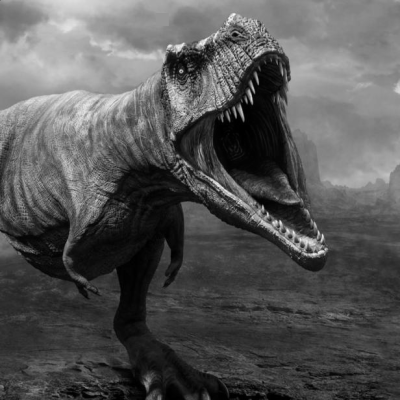

In [53]:
cv2_imshow(image)

In [54]:
image = cv2.imread('/content/drive/MyDrive/Colab/dino.jpeg')

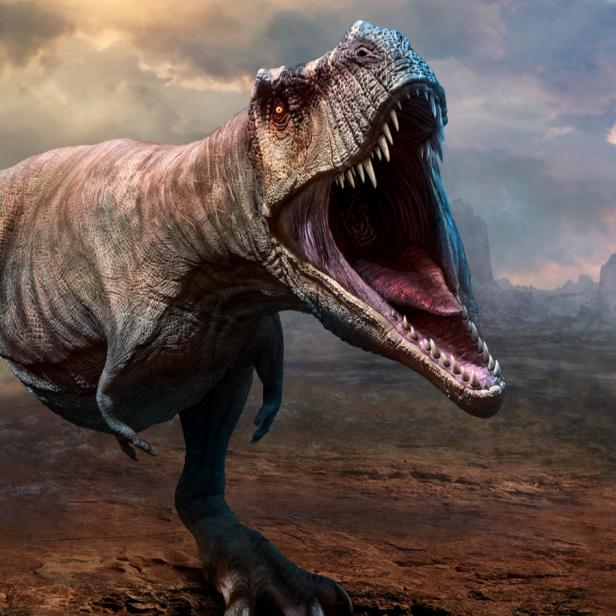

In [55]:
cv2_imshow(image)

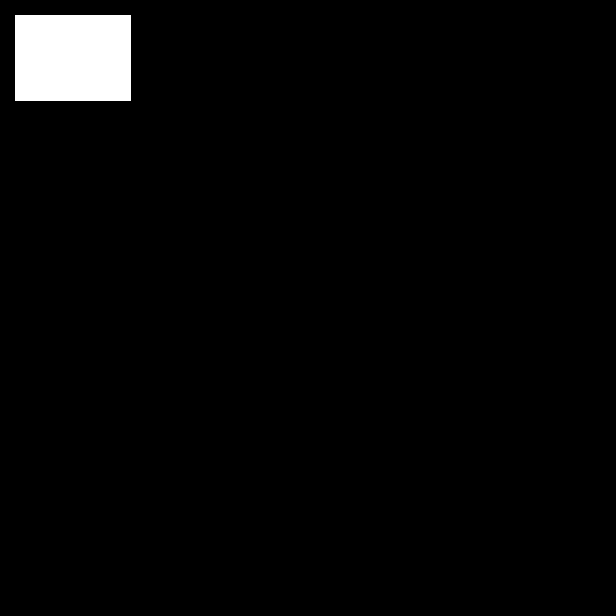

In [56]:
mask = np.zeros(image.shape[:2], dtype="uint8")
cv2.rectangle(mask, (15,15), (130,100), 255, -1)
cv2_imshow(mask)

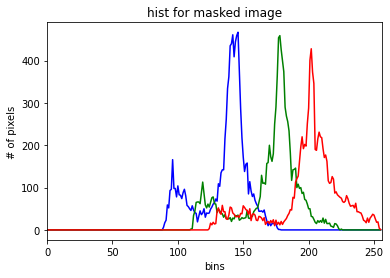

In [57]:
plot_histogram(image,"hist for masked image", mask=mask)
plt.show()

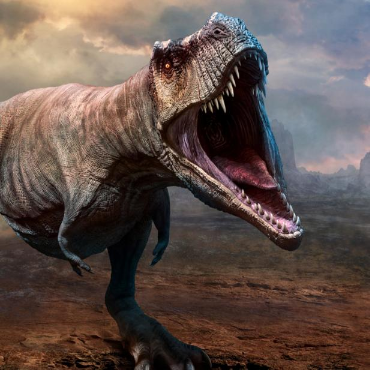

In [58]:
# resize 
resized = cv2.resize(image, (0,0), fx=0.6, fy=0.6)
cv2_imshow(resized)

In [59]:
image = resized

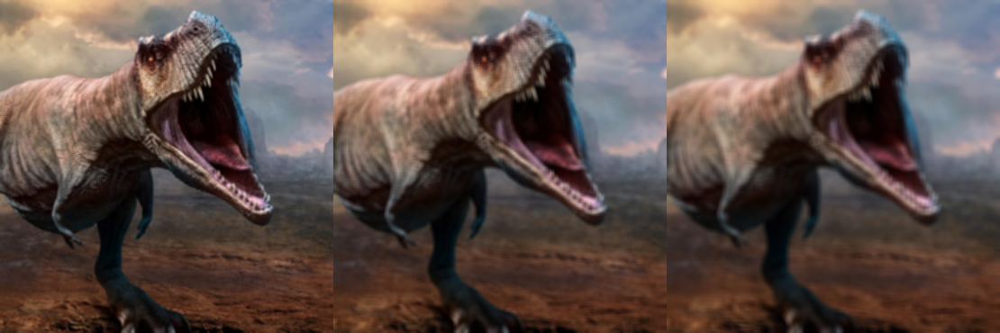

In [60]:
# blurring
blurred = np.hstack([
                     cv2.blur(image, (3,3)),
                     cv2.blur(image, (5,5)),
                     cv2.blur(image, (7,7))
                     ])
cv2_imshow(blurred)

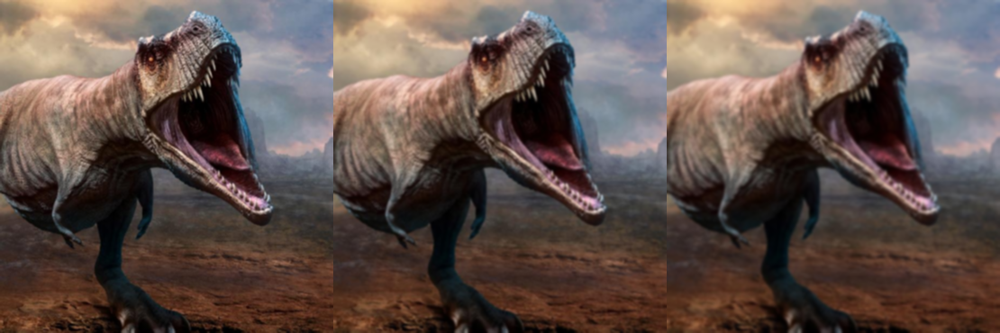

In [61]:
gau = np.hstack([
                 cv2.GaussianBlur(image, (3,3), 0),
                 cv2.GaussianBlur(image, (5,5), 0),
                 cv2.GaussianBlur(image, (7,7), 0)
])
cv2_imshow(gau)

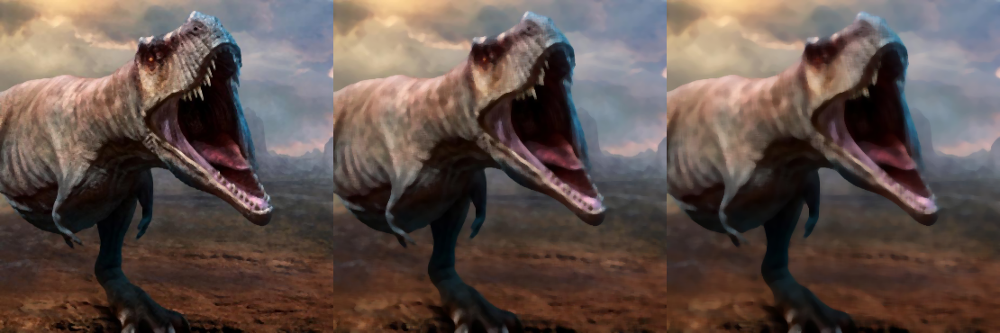

In [62]:
med = np.hstack([
                 cv2.medianBlur(image, 3),
                 cv2.medianBlur(image, 5),
                 cv2.medianBlur(image, 7)
])
cv2_imshow(med)

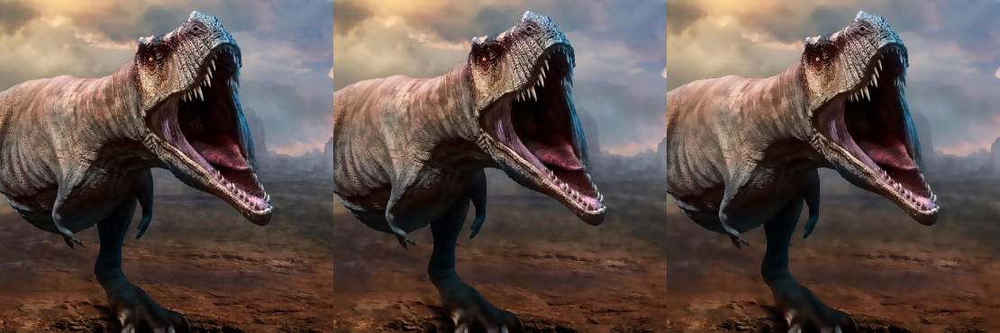

In [63]:
bil = np.hstack([
                 cv2.bilateralFilter(image, 5, 21, 21),
                 cv2.bilateralFilter(image, 7, 31, 31),
                 cv2.bilateralFilter(image, 9, 41, 41)
])
cv2_imshow(bil)

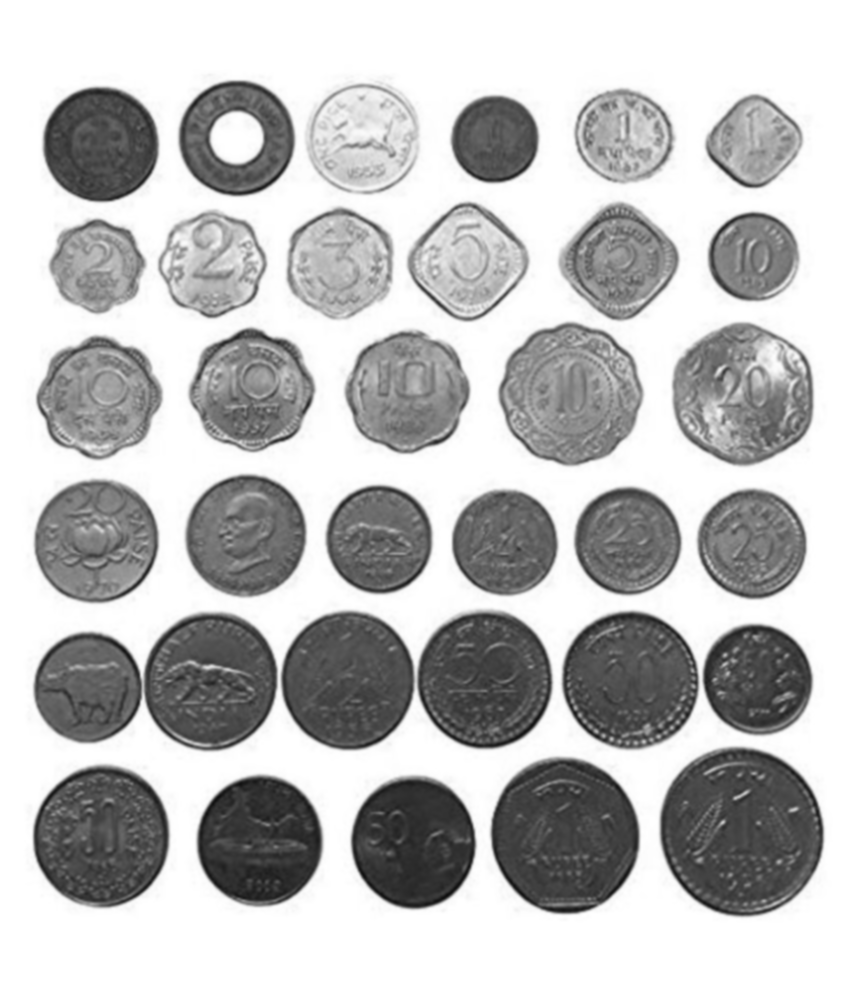

In [64]:
# convert bgr to gray 
coin = cv2.imread("/content/drive/MyDrive/Colab/coins.jpeg")
coin = cv2.cvtColor(coin, cv2.COLOR_BGR2GRAY)
# gaussian blur
blur = cv2.GaussianBlur(coin, (5,5), 0)  
# show image 
cv2_imshow(blur)

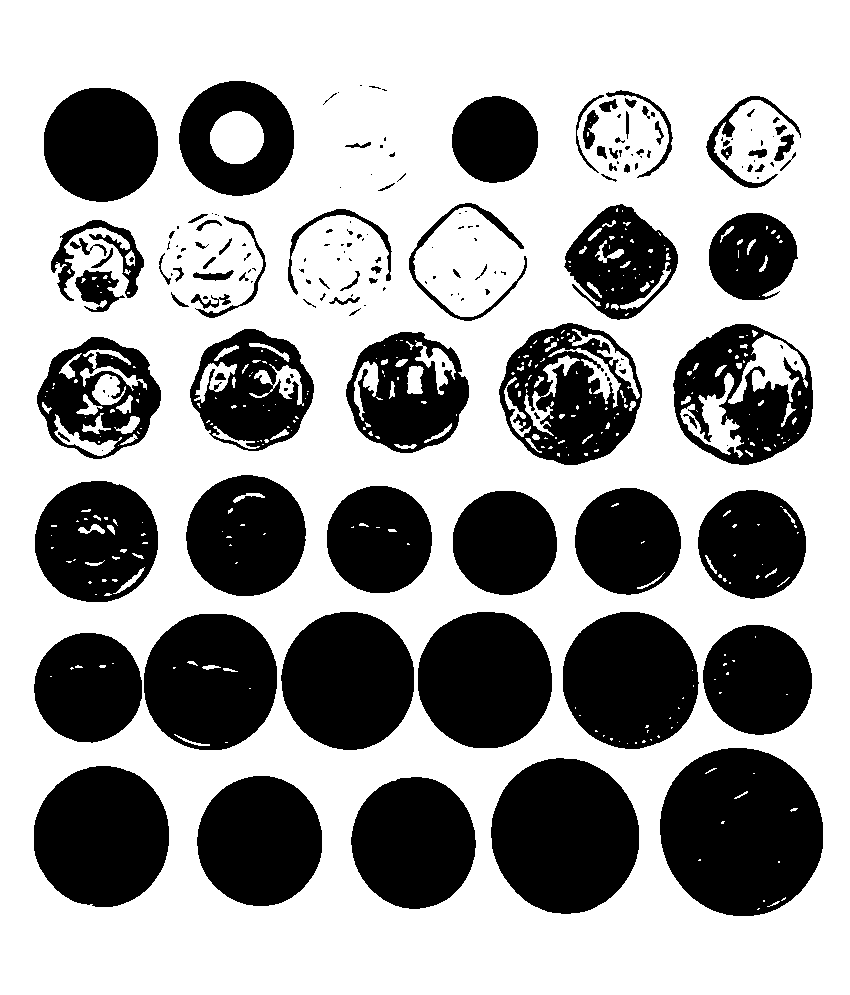

In [65]:
(T, thresh) = cv2.threshold(blur, 155, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh)

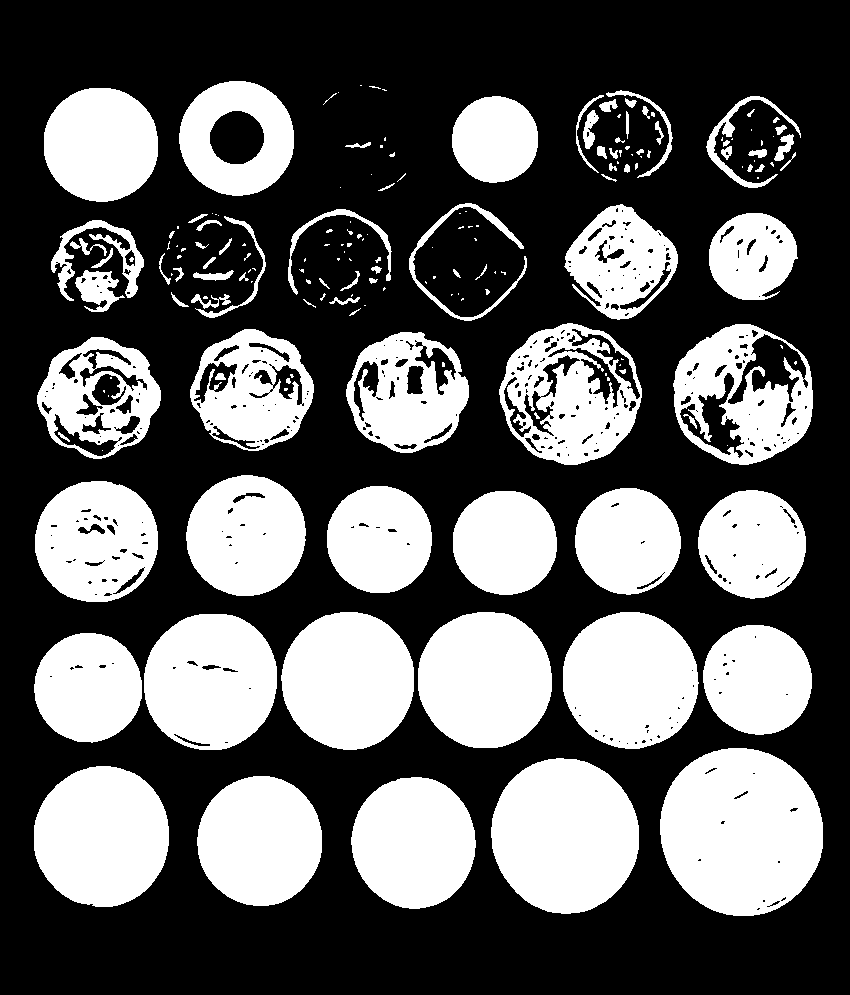

In [66]:
# inverse 
(T, threshInv) = cv2.threshold(blur, 155, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(threshInv)

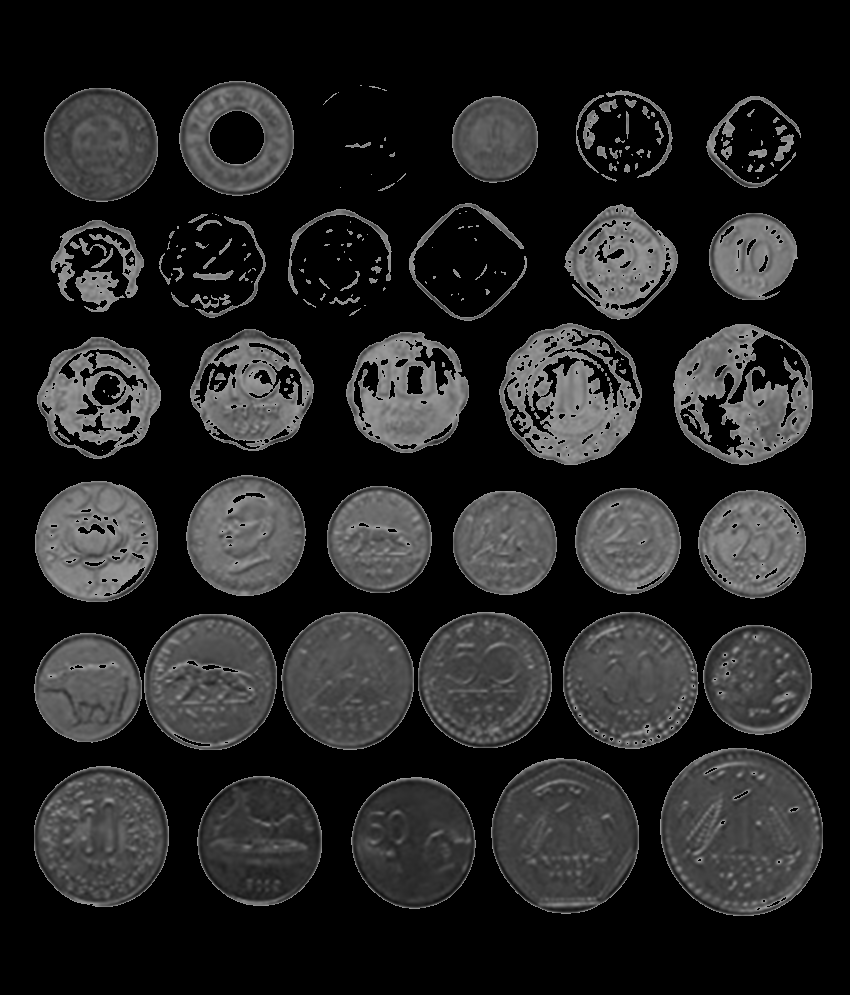

In [67]:
masked = cv2.bitwise_and(blur, blur, mask=threshInv)
cv2_imshow(masked)

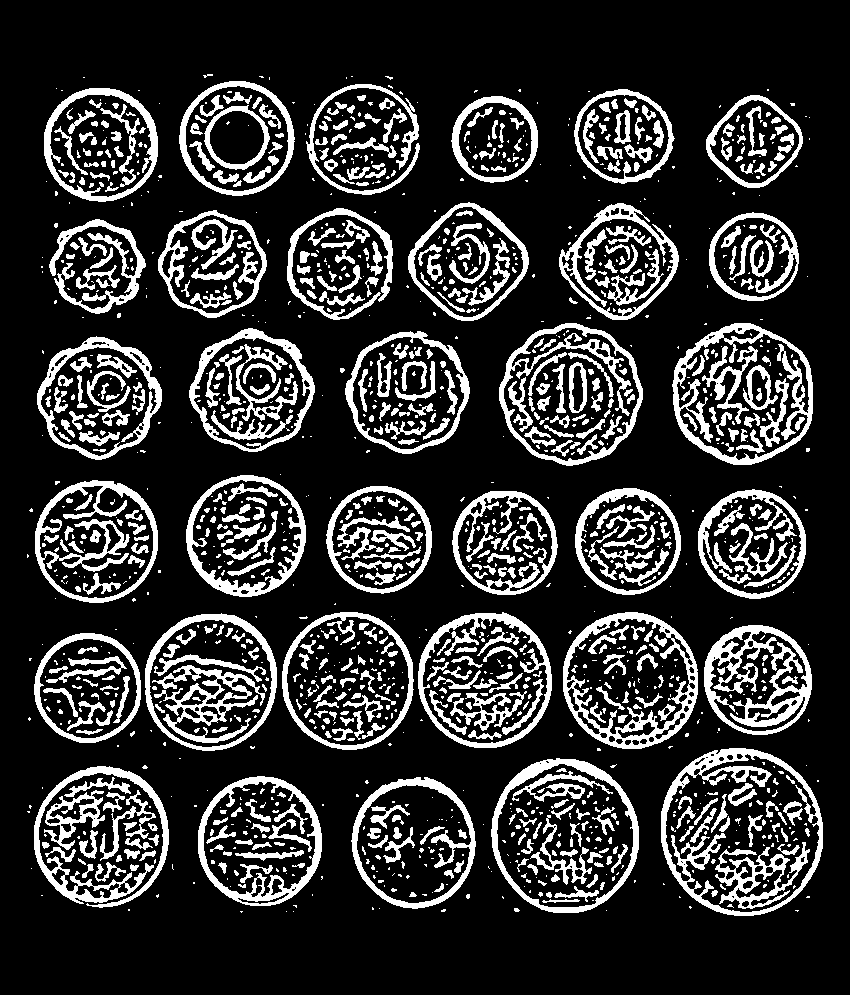

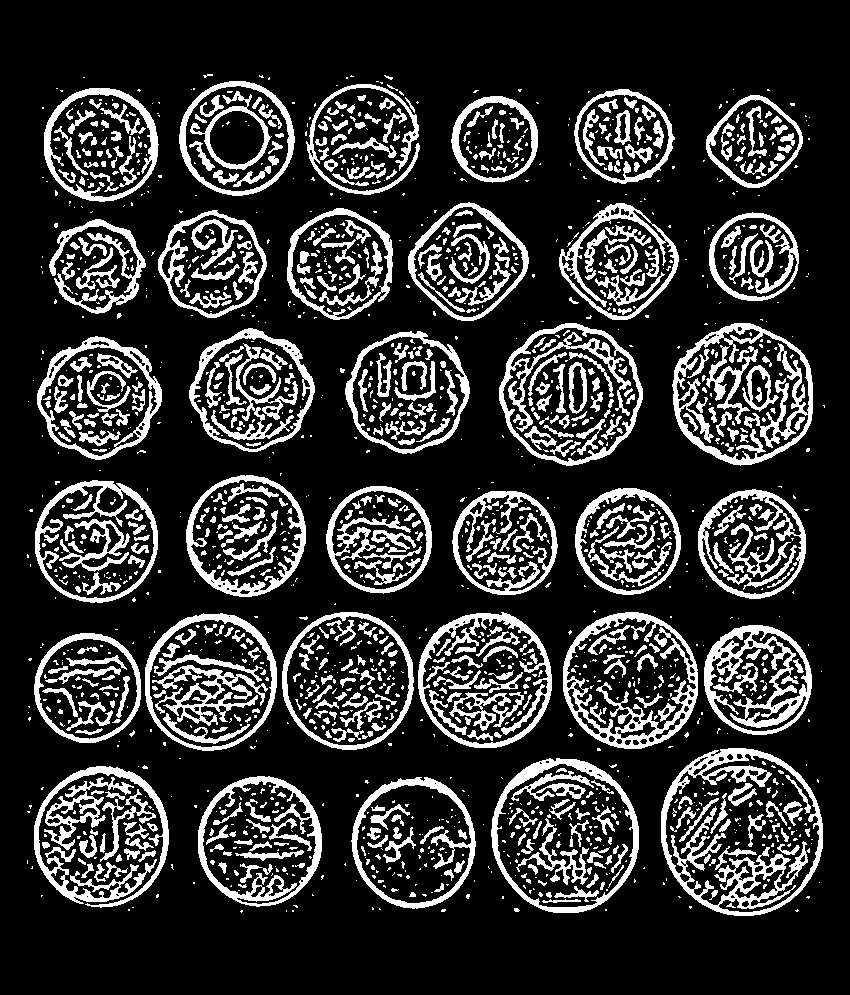

In [68]:
thresh_mean = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 4)
cv2_imshow(thresh_mean)
thresh_gau = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 3)
cv2_imshow(thresh_gau)

In [69]:
!pip install mahotas

     |████████████████████████████████| 5.7MB 6.6MB/s 


In [70]:
# automatically compute threshold value of T
# OTSU
import mahotas
T = mahotas.thresholding.otsu(blur)
print("Otsu's threshold: {}".format(T))

Otsu's threshold: 173


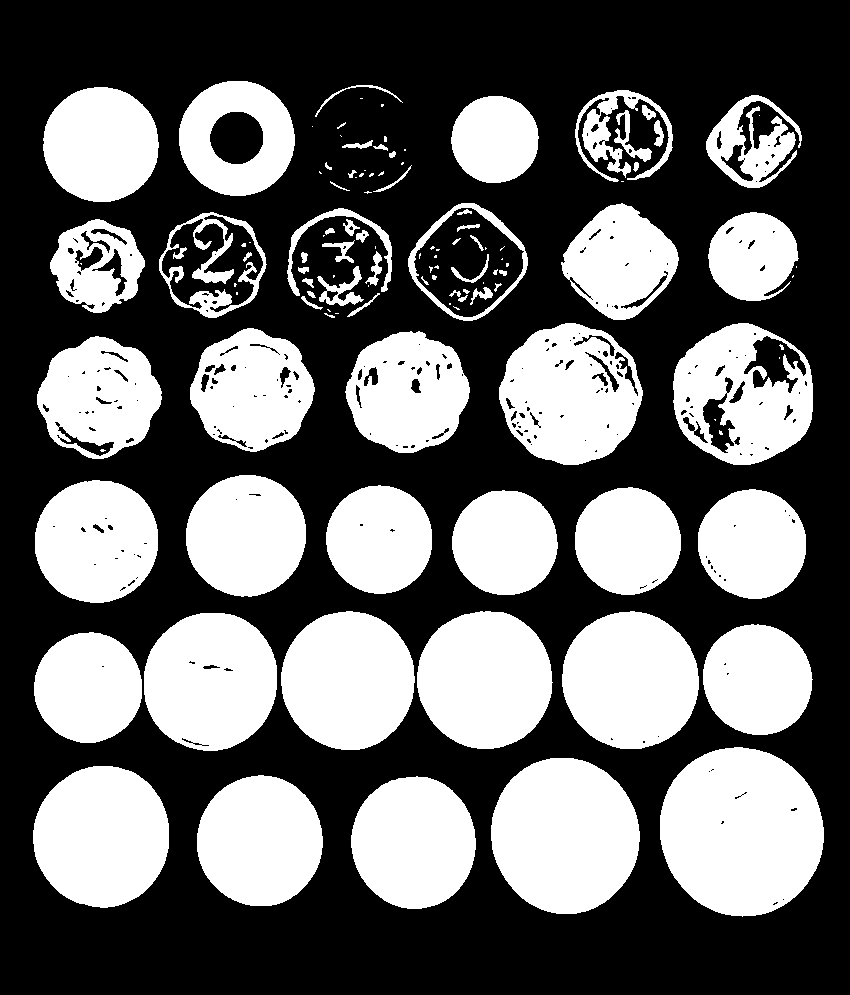

In [71]:
thresh = blur.copy()
thresh[thresh > T] = 255
thresh[thresh < 255] = 0
thresh = cv2.bitwise_not(thresh)
cv2_imshow(thresh)

RC's threshold: 173.41473509260544


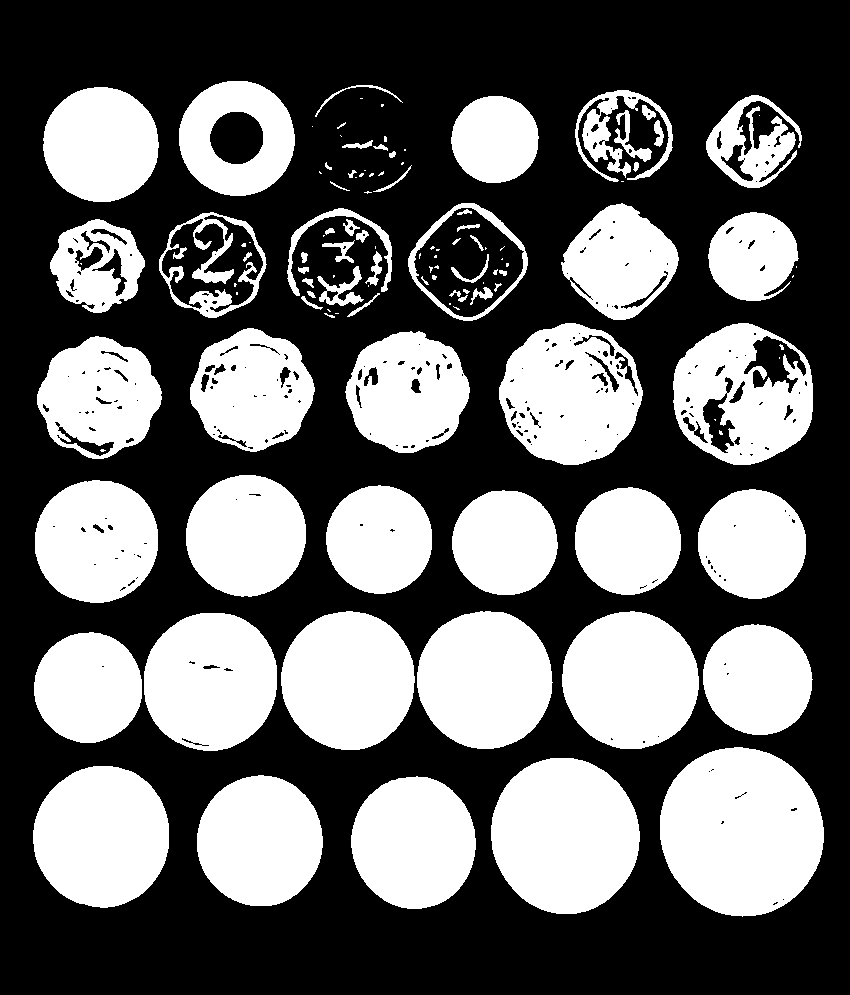

In [72]:
T = mahotas.thresholding.rc(blur)
print("RC's threshold: {}".format(T))
thresh = blur.copy()
thresh[thresh > T] = 255
thresh[thresh < 255] = 0
thresh = cv2.bitwise_not(thresh)
cv2_imshow(thresh)

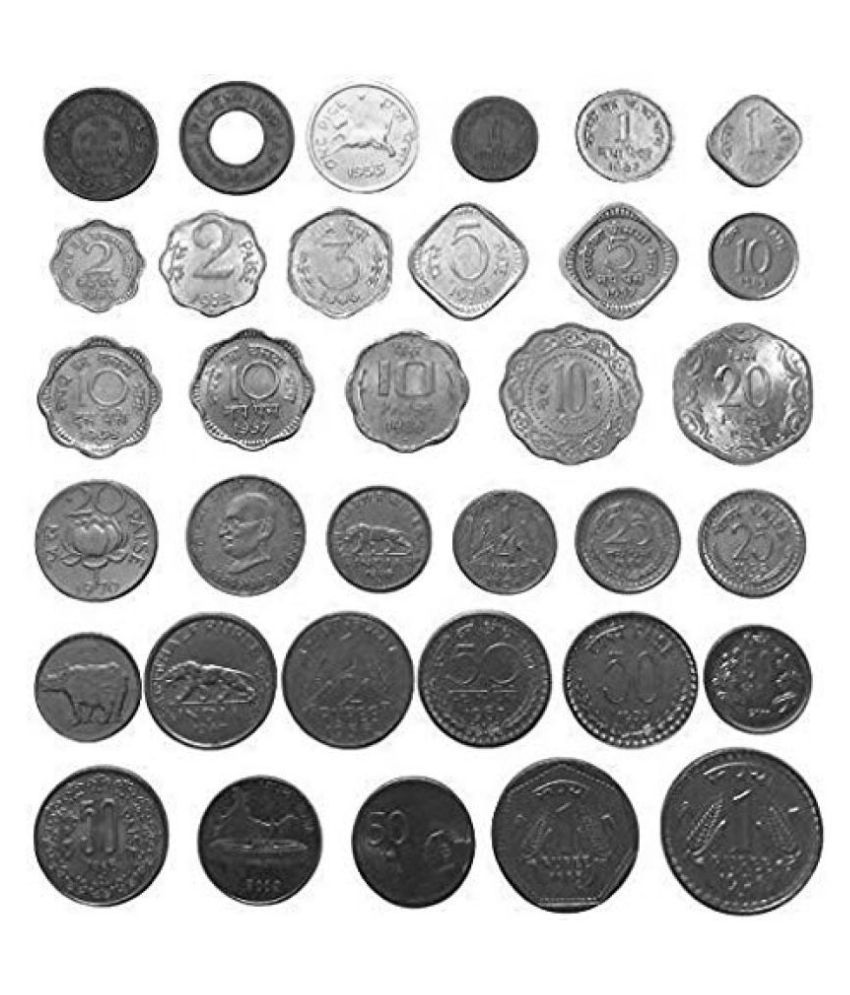

In [77]:
cv2_imshow(coin)

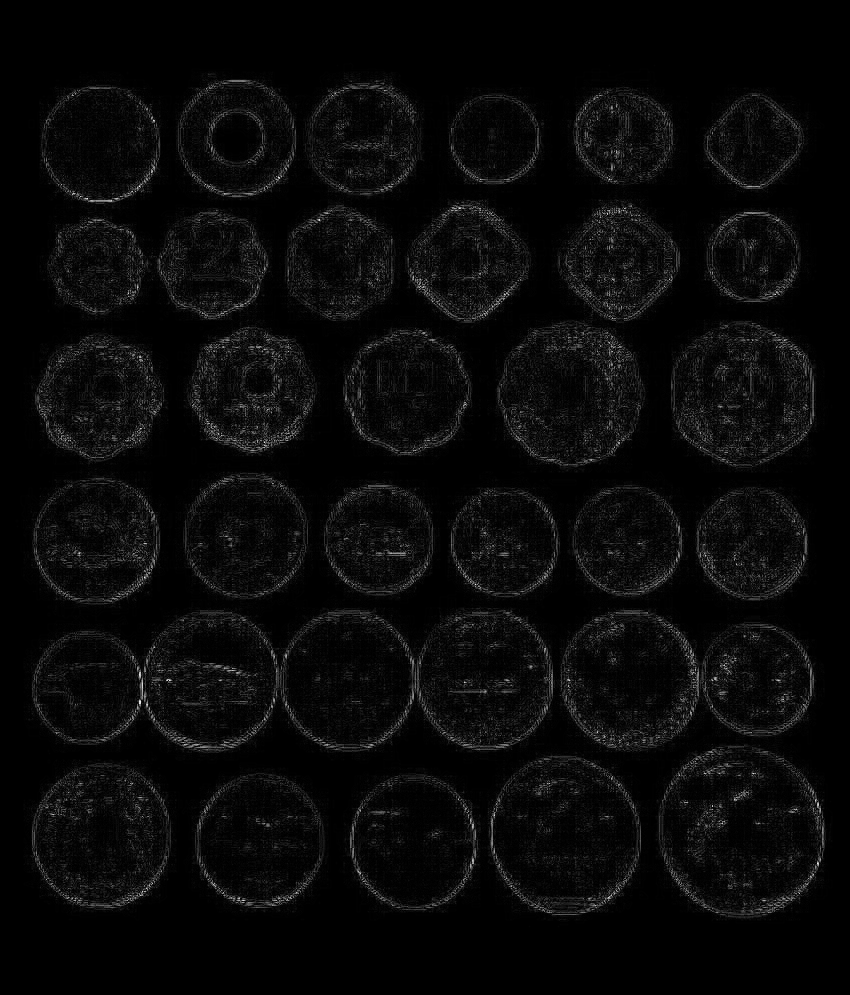

In [79]:
# lap
lap = cv2.Laplacian(coin, cv2.CV_64F)
lap = np.uint8(np.absolute(lap))
cv2_imshow(lap)

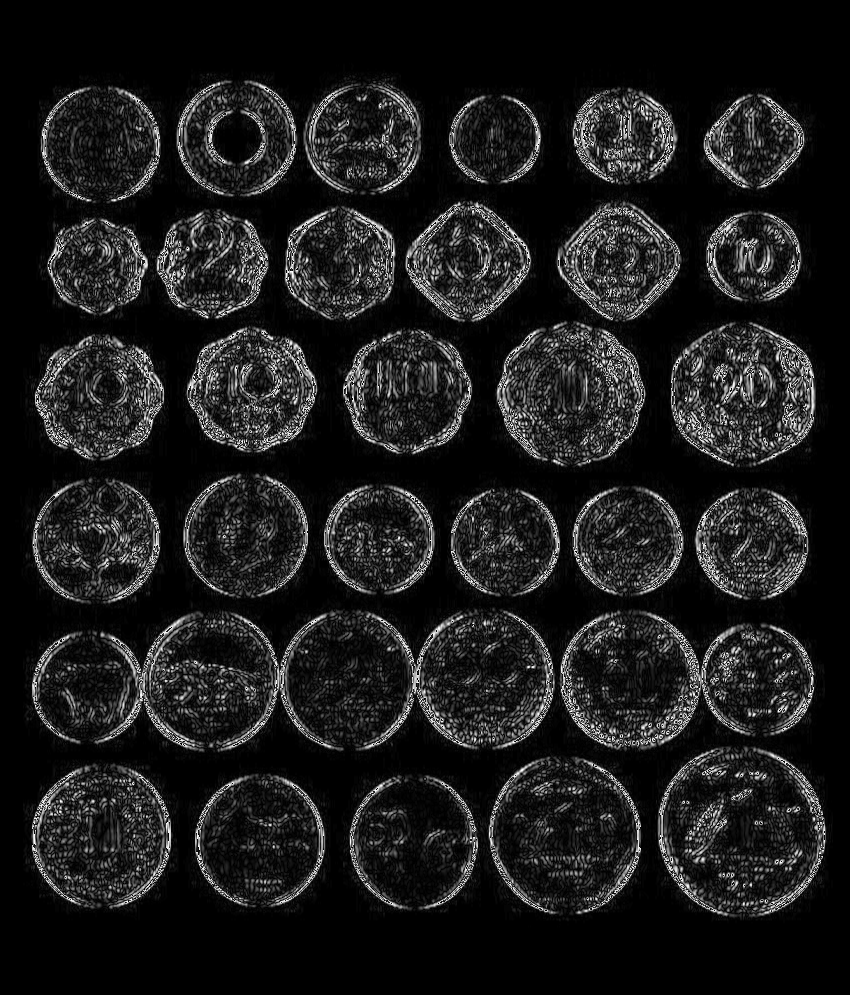

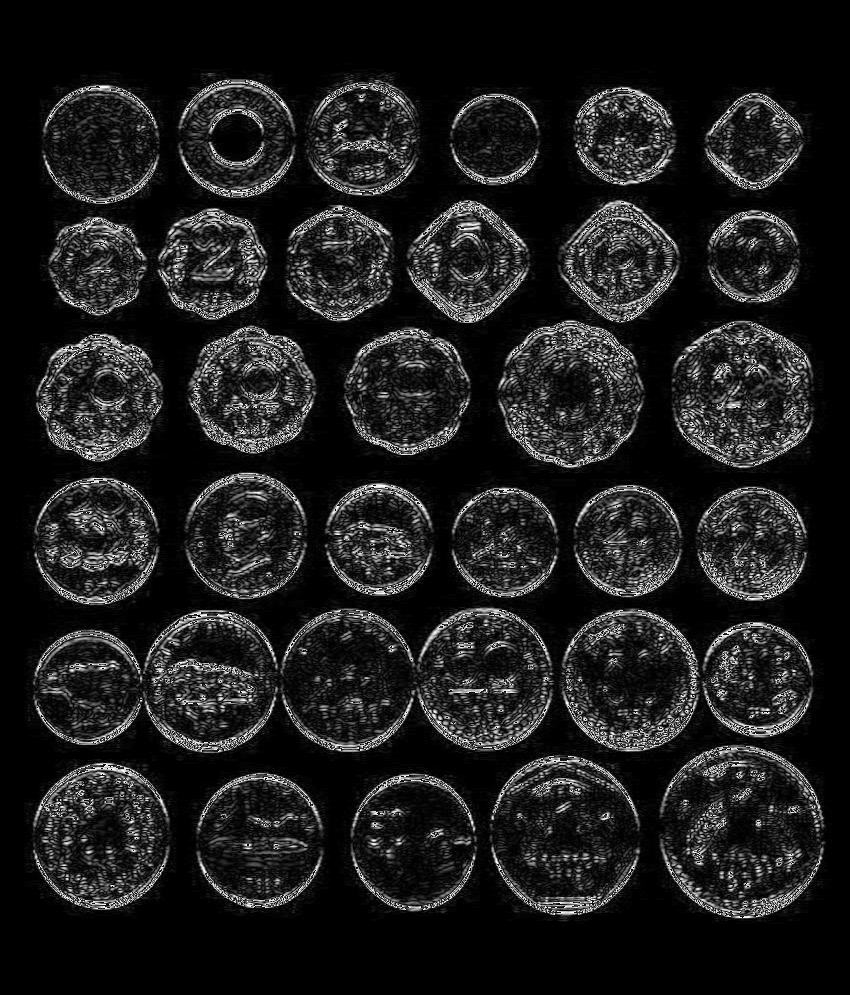

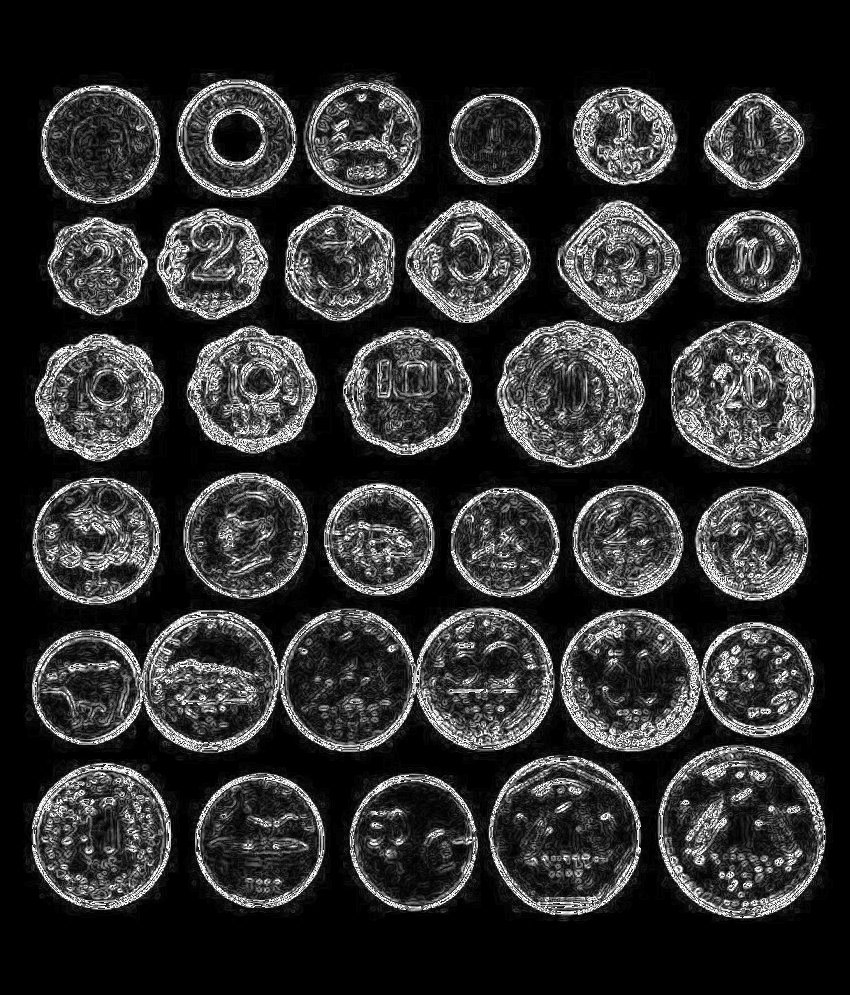

In [81]:
# sobel
sobelX = cv2.Sobel(coin, cv2.CV_64F, 1, 0)
sobelY = cv2.Sobel(coin, cv2.CV_64F, 0, 1)

sobelX = np.uint8(np.absolute(sobelX))
sobelY = np.uint8(np.absolute(sobelY))

sobelcombined = cv2.bitwise_or(sobelX, sobelY)

cv2_imshow(sobelX)
cv2_imshow(sobelY)
cv2_imshow(sobelcombined)

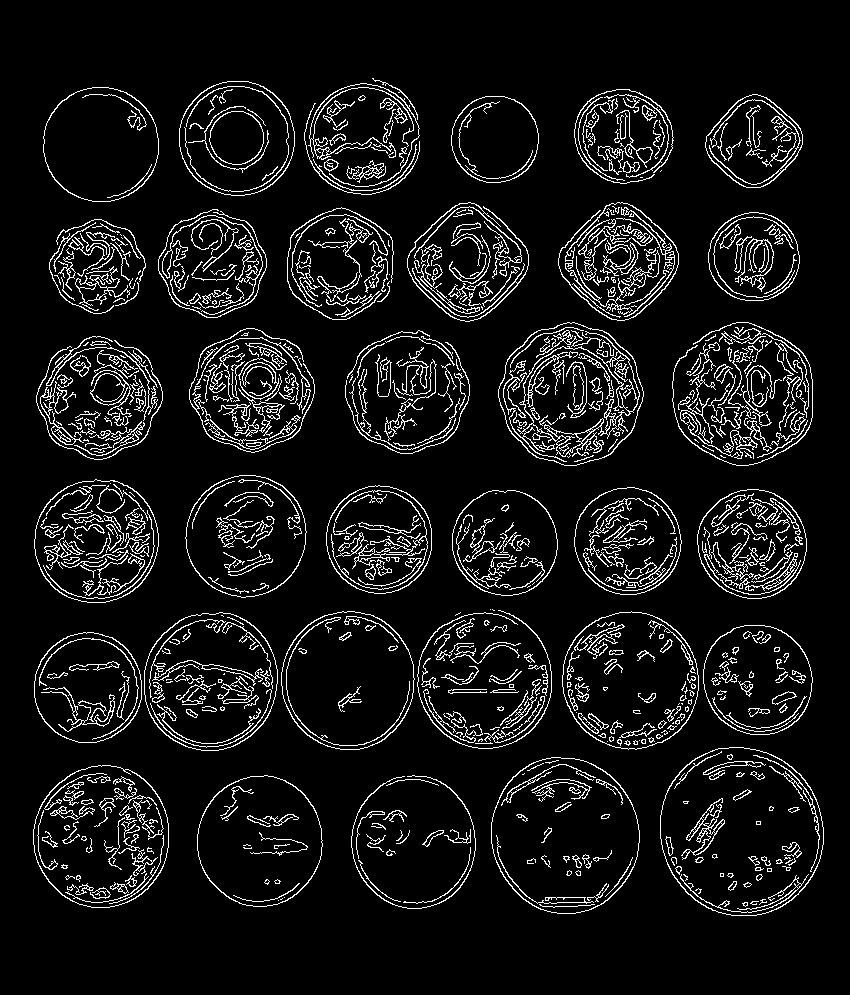

In [83]:
# canny edge detection
canny = cv2.Canny(blur, 30, 150)
cv2_imshow(canny)

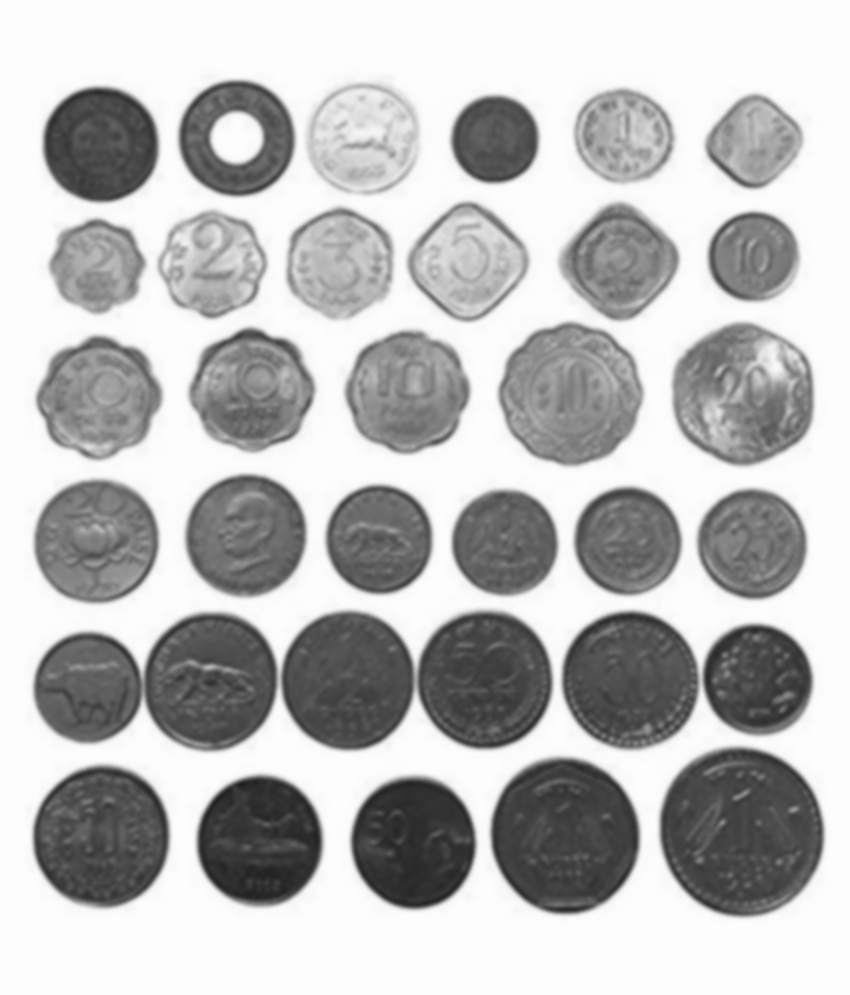

In [84]:
# contours 
blurred = cv2.GaussianBlur(coin, (11,11), 0)
cv2_imshow(blurred)

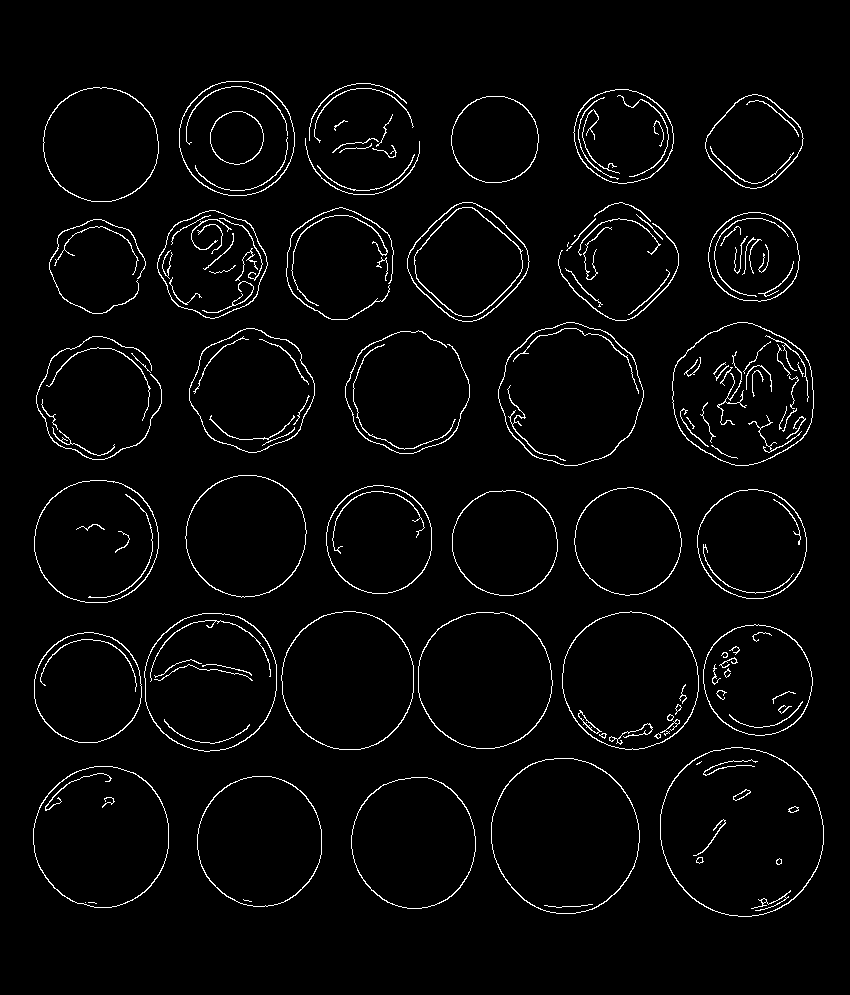

In [85]:
edged = cv2.Canny(blurred, 30, 150)
cv2_imshow(edged)

In [88]:
(cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("I count {} coins in this image".format(len(cnts)))

I count 60 coins in this image


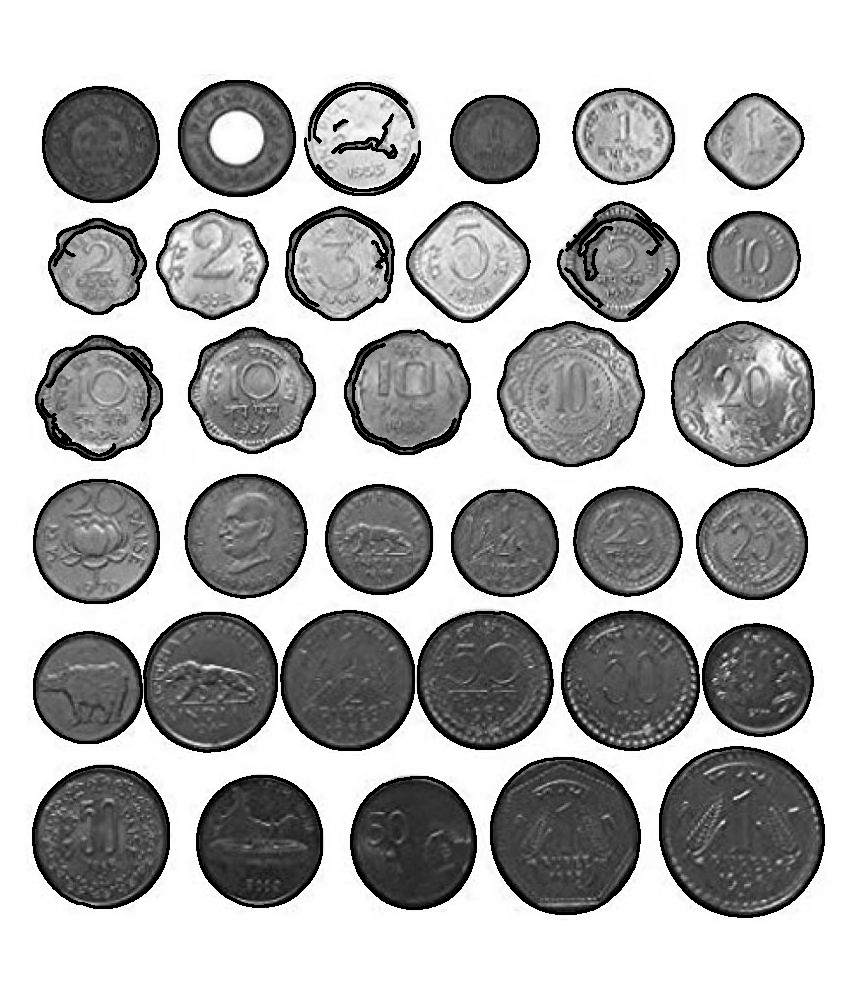

In [90]:
coins = coin.copy()
cv2.drawContours(coins, cnts, -1, (0, 0, 255), 2)
cv2_imshow(coins)